In [1]:
import os
import sys
from datetime import timedelta
from pathlib import Path
from glob import glob
from scipy.io import FortranFile
import numpy as np
import matplotlib.pyplot as plt
sys.path.append(os.path.join(os.environ['DEV'], 'sunflower'))
sys.path.append(os.path.join(os.environ['DEV'], 'sunflower/balltracking'))
import balltrack as blt

In [2]:
vpf = '../tests/vp000001.data'
vtf = '../tests/vt000001.data'
print(os.path.exists(vpf), os.path.exists(vtf))

True True


In [3]:
vp = np.fromfile(vpf).reshape([512, 1024])
vt = np.fromfile(vtf).reshape([512, 1024])
vm = np.sqrt(vp**2 + vt**2)

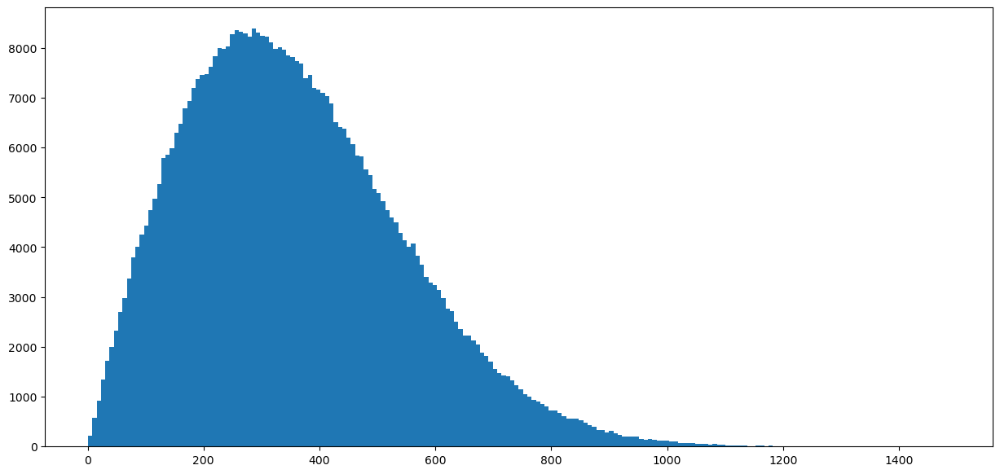

In [4]:
plt.figure(figsize=(15,7))
plt.hist(vm.ravel(), bins=200);

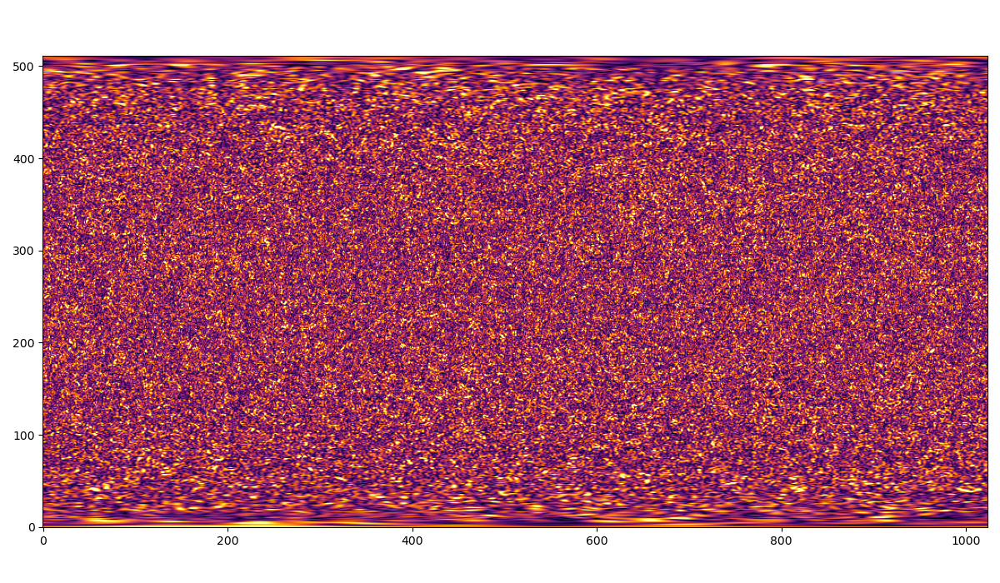

In [5]:
%matplotlib widget
plt.figure(figsize=(12,7))
plt.imshow(vm, origin='lower', vmin=0, vmax=800, cmap='inferno')
plt.tight_layout()

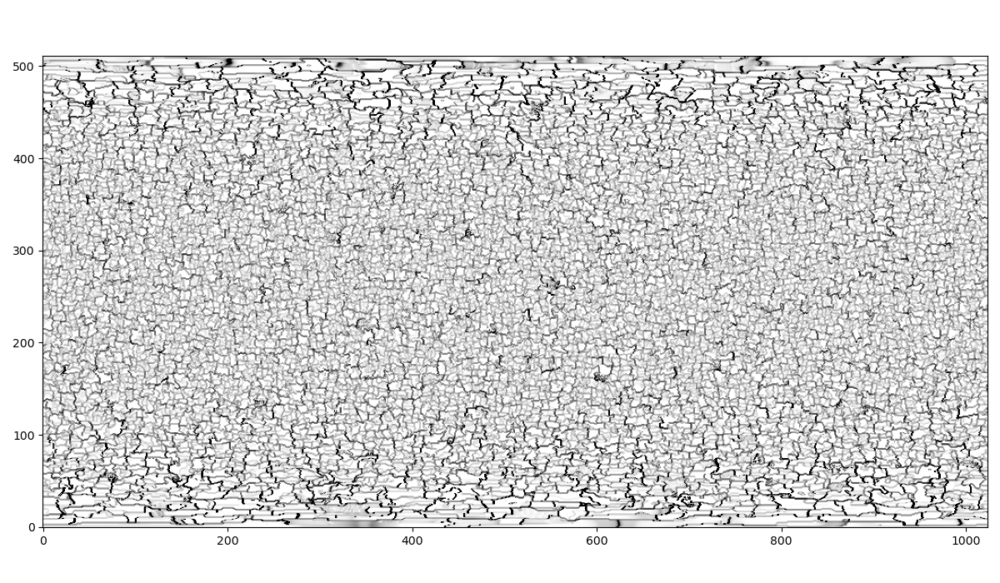

In [6]:
lanes = blt.make_lanes(vp, vt, 40, 4)
plt.figure(figsize=(12,7))
plt.imshow(lanes, origin='lower', vmin=0, vmax=10, cmap='gray_r')
plt.tight_layout()

In [7]:
vpfs = sorted(glob('../tests/vp*.data'))
vtfs = sorted(glob('../tests/vt*.data'))

In [39]:
plt.rcParams.update({'font.size': 16})
offset=1712
for i, (vpf, vtf) in enumerate(zip(vpfs[offset:], vtfs[offset:])):
    i = i + offset
    dt = i*timedelta(seconds=15)
    vp = np.fromfile(vpf).reshape([512, 1024])
    vt = np.fromfile(vtf).reshape([512, 1024])
    lanes = blt.make_lanes(vp, vt, 40, 4)
    plt.figure(figsize=(16,10))
    plt.imshow(lanes, origin='lower', vmin=0, vmax=10, cmap='gray_r')
    plt.title(f'Field #{i+1} - elapsed time: {str(dt)}')
    plt.tight_layout()
    plt.savefig(os.path.join(os.environ['DATA'],f'ConFlow/sanity_check/lanes_{i+1:06d}.jpg'))
    plt.close('all')

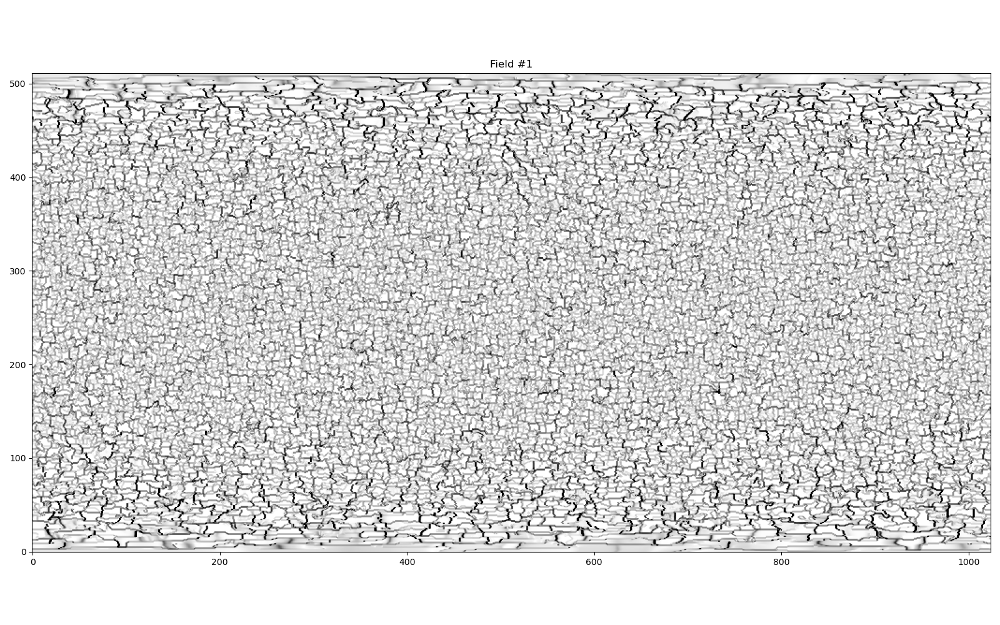

In [37]:
plt.close('all')
i = 0
vp = np.fromfile(vpfs[i]).reshape([512, 1024])
vt = np.fromfile(vtfs[i]).reshape([512, 1024])
lanes = blt.make_lanes(vp, vt, 30, 2)
plt.figure(figsize=(16,10))
plt.imshow(lanes, origin='lower', vmin=0, vmax=10, cmap='gray_r')
plt.title(f'Field #{i+1}')
plt.tight_layout()

# plt.savefig(f'/mnt/data2/ConFlow/sanity_check/sample_lanes.jpg')

In [ ]:
str(timedelta(seconds=15)*3600/15*24)